In [1]:
#!for a in /sys/bus/pci/devices/*; do echo 0 | sudo tee -a $a/numa_node; done
import tensorflow as tf
import matplotlib.pyplot as plt
import os
from data_processing import dataset
from models import model
from utils import tools
from plots import plots, edge_detection_plots

os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'

2023-02-02 23:35:29.010161: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-02 23:35:29.106720: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-02-02 23:35:29.127390: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-02-02 23:35:29.535667: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

In [2]:
config_directory = 'FENet'

config_path = os.path.join(os.getcwd(), 'configs', config_directory)
DataProcessing = dataset.DataProcessing(config_path=config_path)
Model = model.Model(config_path)
tools.parser(Model.cfg, DataProcessing.cfg)
Model.load_data(DataProcessing.cfg["NAME"])
DataProcessing.load_dataset_information()

2023-02-02 23:35:30.666167: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-02 23:35:30.669949: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-02 23:35:30.670068: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-02-02 23:35:30.670851: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the approp

# Load Dataset, Preprocess Images and Dataset

The TRAIN DS contains 1500 images.
The TEST DS contains 300 images.
The REAL_WORLD DS contains 41 images.


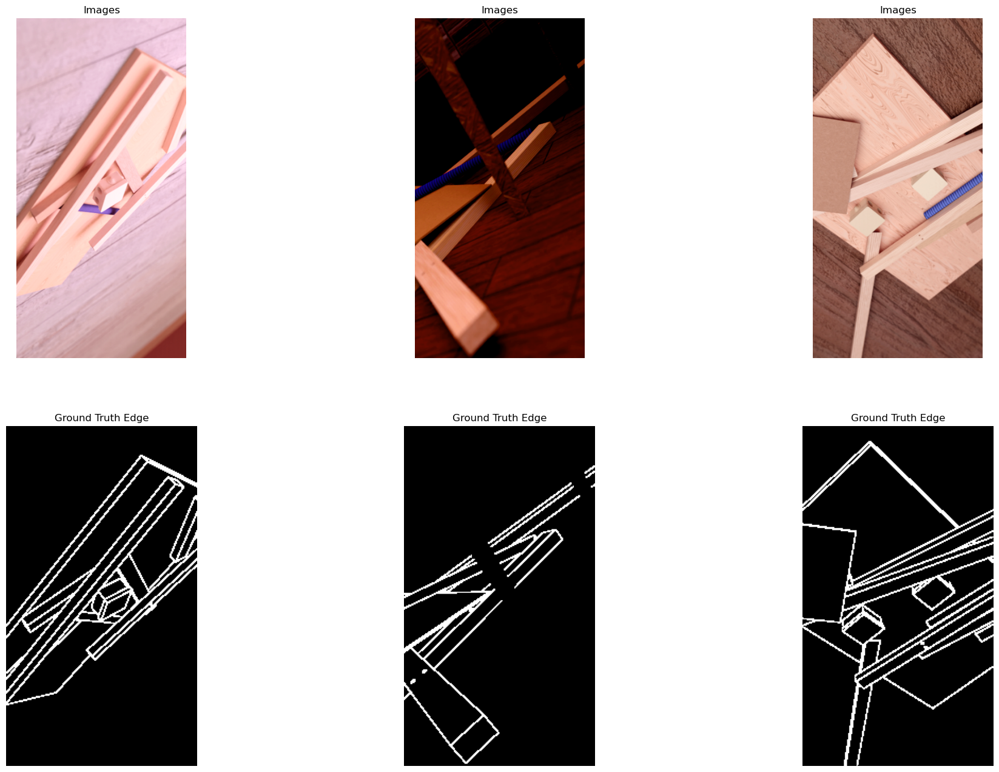

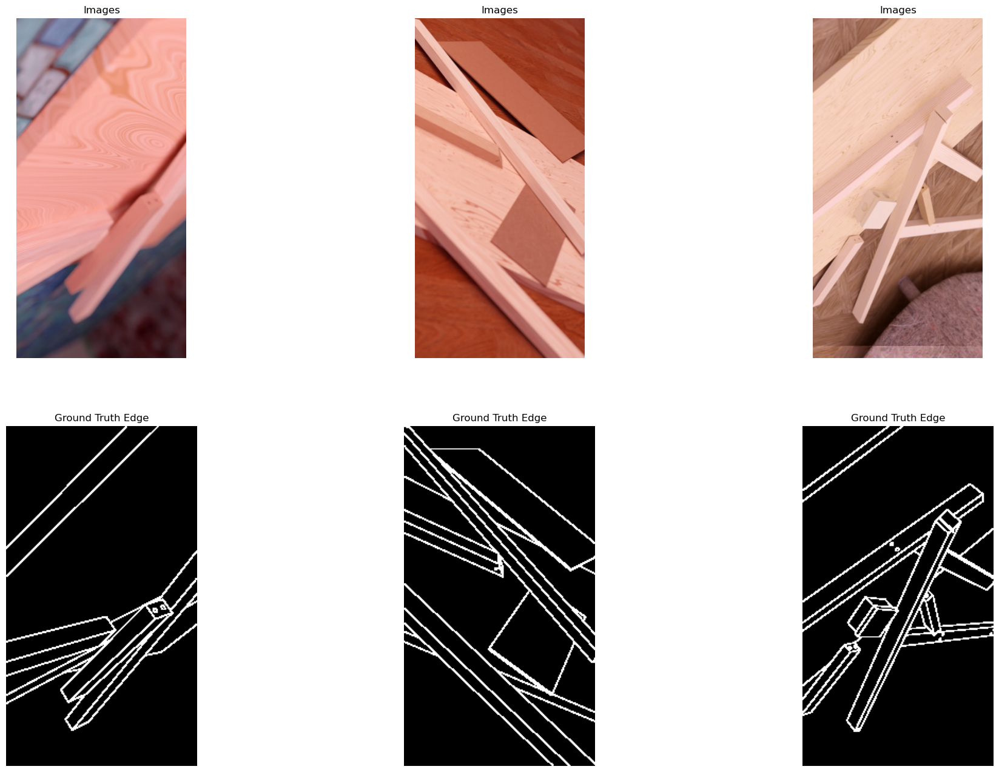

In [3]:
if Model.train_model:
    train_ds, img_count_train = DataProcessing.load_dataset(DataProcessing.key.train)
test_ds, img_count_test = DataProcessing.load_dataset(DataProcessing.key.test)

real_world_ds, img_count_real_world_ds = DataProcessing.load_dataset(DataProcessing.key.real_world)

if Model.train_model:
    for inp, out in train_ds.take(2):
        edge_detection_plots.plot_edges(images=inp['in_img'], labels_edge=out['out_edge'],
                                        batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'])

# Define, Compile and Train Model

In [4]:
if Model.train_model:
    model = Model.get_neural_network_model(DataProcessing.input_data_cfg, DataProcessing.output_data_cfg)
    # model.summary()

    lr = Model.get_lr(img_count_train, DataProcessing.cfg['TRAIN']['BATCH_SIZE'])
    model.compile(optimizer=tf.keras.optimizers.Adam(lr),
                  loss=Model.get_loss_function(DataProcessing.output_data_cfg),
                  metrics=Model.get_metrics(DataProcessing.output_data_cfg))

    history = model.fit(train_ds, epochs=Model.cfg["EPOCHS"], validation_data=test_ds,
                        callbacks=Model.get_callbacks(), verbose=1)

model = Model.get_best_model_from_checkpoints()

Epoch 1/200


2023-02-02 23:35:44.056912: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2023-02-02 23:35:45.231085: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


500/500 [==============================] - 55s 97ms/step - loss: 4277.6079 - accuracy: 0.9170 - accuracy_edge_1: 0.9170 - f1_edge: 0.4183 - precision_edge: 0.4663 - recall_edge: 0.3889 - f1_edge_1: 0.4183 - precision_edge_1: 0.4663 - recall_edge_1: 0.3889 - val_loss: 3324.4214 - val_accuracy: 0.9644 - val_accuracy_edge_1: 0.9644 - val_f1_edge: 0.7543 - val_precision_edge: 0.6964 - val_recall_edge: 0.8227 - val_f1_edge_1: 0.7543 - val_precision_edge_1: 0.6964 - val_recall_edge_1: 0.8227
Epoch 2/200
500/500 [==============================] - 48s 96ms/step - loss: 2706.9976 - accuracy: 0.9700 - accuracy_edge_1: 0.9700 - f1_edge: 0.7724 - precision_edge: 0.7521 - recall_edge: 0.7940 - f1_edge_1: 0.7724 - precision_edge_1: 0.7521 - recall_edge_1: 0.7940 - val_loss: 3095.0798 - val_accuracy: 0.9555 - val_accuracy_edge_1: 0.9555 - val_f1_edge: 0.7310 - val_precision_edge: 0.6107 - val_recall_edge: 0.9104 - val_f1_edge_1: 0.7310 - val_precision_edge_1: 0.6107 - val_recall_edge_1: 0.9104
Epoch 

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=1414.76-epoch=20.00-f1=0.9194/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=1414.76-epoch=20.00-f1=0.9194/assets


500/500 [==============================] - 58s 116ms/step - loss: 1466.7556 - accuracy: 0.9882 - accuracy_edge_1: 0.9882 - f1_edge: 0.9114 - precision_edge: 0.9072 - recall_edge: 0.9157 - f1_edge_1: 0.9114 - precision_edge_1: 0.9072 - recall_edge_1: 0.9157 - val_loss: 1414.7556 - val_accuracy: 0.9891 - val_accuracy_edge_1: 0.9891 - val_f1_edge: 0.9194 - val_precision_edge: 0.8996 - val_recall_edge: 0.9401 - val_f1_edge_1: 0.9194 - val_precision_edge_1: 0.8996 - val_recall_edge_1: 0.9401
Epoch 21/200
500/500 [==============================] - 47s 94ms/step - loss: 1436.4047 - accuracy: 0.9891 - accuracy_edge_1: 0.9891 - f1_edge: 0.9177 - precision_edge: 0.9153 - recall_edge: 0.9201 - f1_edge_1: 0.9177 - precision_edge_1: 0.9153 - recall_edge_1: 0.9201 - val_loss: 1638.4413 - val_accuracy: 0.9850 - val_accuracy_edge_1: 0.9850 - val_f1_edge: 0.8950 - val_precision_edge: 0.8360 - val_recall_edge: 0.9629 - val_f1_edge_1: 0.8950 - val_precision_edge_1: 0.8360 - val_recall_edge_1: 0.9629
Epoc

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=1212.04-epoch=40.00-f1=0.9305/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=1212.04-epoch=40.00-f1=0.9305/assets


500/500 [==============================] - 61s 123ms/step - loss: 1246.7698 - accuracy: 0.9909 - accuracy_edge_1: 0.9909 - f1_edge: 0.9317 - precision_edge: 0.9301 - recall_edge: 0.9334 - f1_edge_1: 0.9317 - precision_edge_1: 0.9301 - recall_edge_1: 0.9334 - val_loss: 1212.0416 - val_accuracy: 0.9907 - val_accuracy_edge_1: 0.9907 - val_f1_edge: 0.9305 - val_precision_edge: 0.9192 - val_recall_edge: 0.9422 - val_f1_edge_1: 0.9305 - val_precision_edge_1: 0.9192 - val_recall_edge_1: 0.9422
Epoch 41/200
500/500 [==============================] - 47s 93ms/step - loss: 1225.2412 - accuracy: 0.9914 - accuracy_edge_1: 0.9914 - f1_edge: 0.9355 - precision_edge: 0.9335 - recall_edge: 0.9375 - f1_edge_1: 0.9355 - precision_edge_1: 0.9335 - recall_edge_1: 0.9375 - val_loss: 1230.4316 - val_accuracy: 0.9911 - val_accuracy_edge_1: 0.9911 - val_f1_edge: 0.9342 - val_precision_edge: 0.9187 - val_recall_edge: 0.9503 - val_f1_edge_1: 0.9342 - val_precision_edge_1: 0.9187 - val_recall_edge_1: 0.9503
Epoc

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=1069.82-epoch=60.00-f1=0.9449/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=1069.82-epoch=60.00-f1=0.9449/assets


500/500 [==============================] - 58s 116ms/step - loss: 1100.3920 - accuracy: 0.9927 - accuracy_edge_1: 0.9927 - f1_edge: 0.9438 - precision_edge: 0.9439 - recall_edge: 0.9437 - f1_edge_1: 0.9438 - precision_edge_1: 0.9439 - recall_edge_1: 0.9437 - val_loss: 1069.8225 - val_accuracy: 0.9927 - val_accuracy_edge_1: 0.9927 - val_f1_edge: 0.9449 - val_precision_edge: 0.9417 - val_recall_edge: 0.9481 - val_f1_edge_1: 0.9449 - val_precision_edge_1: 0.9417 - val_recall_edge_1: 0.9481
Epoch 61/200
500/500 [==============================] - 48s 96ms/step - loss: 1141.5800 - accuracy: 0.9926 - accuracy_edge_1: 0.9926 - f1_edge: 0.9439 - precision_edge: 0.9445 - recall_edge: 0.9433 - f1_edge_1: 0.9439 - precision_edge_1: 0.9445 - recall_edge_1: 0.9433 - val_loss: 1063.2793 - val_accuracy: 0.9927 - val_accuracy_edge_1: 0.9927 - val_f1_edge: 0.9451 - val_precision_edge: 0.9495 - val_recall_edge: 0.9408 - val_f1_edge_1: 0.9451 - val_precision_edge_1: 0.9495 - val_recall_edge_1: 0.9408
Epoc

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=1023.75-epoch=80.00-f1=0.9489/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=1023.75-epoch=80.00-f1=0.9489/assets


500/500 [==============================] - 59s 118ms/step - loss: 1028.5046 - accuracy: 0.9934 - accuracy_edge_1: 0.9934 - f1_edge: 0.9505 - precision_edge: 0.9525 - recall_edge: 0.9485 - f1_edge_1: 0.9505 - precision_edge_1: 0.9525 - recall_edge_1: 0.9485 - val_loss: 1023.7484 - val_accuracy: 0.9933 - val_accuracy_edge_1: 0.9933 - val_f1_edge: 0.9489 - val_precision_edge: 0.9557 - val_recall_edge: 0.9421 - val_f1_edge_1: 0.9489 - val_precision_edge_1: 0.9557 - val_recall_edge_1: 0.9421
Epoch 81/200
500/500 [==============================] - 47s 94ms/step - loss: 1007.3401 - accuracy: 0.9934 - accuracy_edge_1: 0.9934 - f1_edge: 0.9500 - precision_edge: 0.9514 - recall_edge: 0.9486 - f1_edge_1: 0.9500 - precision_edge_1: 0.9514 - recall_edge_1: 0.9486 - val_loss: 992.0187 - val_accuracy: 0.9933 - val_accuracy_edge_1: 0.9933 - val_f1_edge: 0.9498 - val_precision_edge: 0.9498 - val_recall_edge: 0.9497 - val_f1_edge_1: 0.9498 - val_precision_edge_1: 0.9498 - val_recall_edge_1: 0.9497
Epoch

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=1005.08-epoch=100.00-f1=0.9484/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=1005.08-epoch=100.00-f1=0.9484/assets


500/500 [==============================] - 59s 117ms/step - loss: 972.3086 - accuracy: 0.9937 - accuracy_edge_1: 0.9937 - f1_edge: 0.9528 - precision_edge: 0.9540 - recall_edge: 0.9516 - f1_edge_1: 0.9528 - precision_edge_1: 0.9540 - recall_edge_1: 0.9516 - val_loss: 1005.0847 - val_accuracy: 0.9931 - val_accuracy_edge_1: 0.9931 - val_f1_edge: 0.9484 - val_precision_edge: 0.9389 - val_recall_edge: 0.9582 - val_f1_edge_1: 0.9484 - val_precision_edge_1: 0.9389 - val_recall_edge_1: 0.9582
Epoch 101/200
500/500 [==============================] - 47s 94ms/step - loss: 976.6131 - accuracy: 0.9931 - accuracy_edge_1: 0.9931 - f1_edge: 0.9465 - precision_edge: 0.9466 - recall_edge: 0.9465 - f1_edge_1: 0.9465 - precision_edge_1: 0.9466 - recall_edge_1: 0.9465 - val_loss: 947.6405 - val_accuracy: 0.9937 - val_accuracy_edge_1: 0.9937 - val_f1_edge: 0.9527 - val_precision_edge: 0.9507 - val_recall_edge: 0.9548 - val_f1_edge_1: 0.9527 - val_precision_edge_1: 0.9507 - val_recall_edge_1: 0.9548
Epoch 

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=940.20-epoch=120.00-f1=0.9547/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=940.20-epoch=120.00-f1=0.9547/assets


500/500 [==============================] - 62s 124ms/step - loss: 936.5762 - accuracy: 0.9941 - accuracy_edge_1: 0.9941 - f1_edge: 0.9547 - precision_edge: 0.9558 - recall_edge: 0.9537 - f1_edge_1: 0.9547 - precision_edge_1: 0.9558 - recall_edge_1: 0.9537 - val_loss: 940.1951 - val_accuracy: 0.9941 - val_accuracy_edge_1: 0.9941 - val_f1_edge: 0.9547 - val_precision_edge: 0.9717 - val_recall_edge: 0.9384 - val_f1_edge_1: 0.9547 - val_precision_edge_1: 0.9717 - val_recall_edge_1: 0.9384
Epoch 121/200
500/500 [==============================] - 47s 94ms/step - loss: 907.6368 - accuracy: 0.9947 - accuracy_edge_1: 0.9947 - f1_edge: 0.9599 - precision_edge: 0.9631 - recall_edge: 0.9567 - f1_edge_1: 0.9599 - precision_edge_1: 0.9631 - recall_edge_1: 0.9567 - val_loss: 896.1611 - val_accuracy: 0.9946 - val_accuracy_edge_1: 0.9946 - val_f1_edge: 0.9596 - val_precision_edge: 0.9623 - val_recall_edge: 0.9569 - val_f1_edge_1: 0.9596 - val_precision_edge_1: 0.9623 - val_recall_edge_1: 0.9569
Epoch 1

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=881.16-epoch=140.00-f1=0.9598/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=881.16-epoch=140.00-f1=0.9598/assets


500/500 [==============================] - 59s 119ms/step - loss: 871.4806 - accuracy: 0.9948 - accuracy_edge_1: 0.9948 - f1_edge: 0.9607 - precision_edge: 0.9635 - recall_edge: 0.9579 - f1_edge_1: 0.9607 - precision_edge_1: 0.9635 - recall_edge_1: 0.9579 - val_loss: 881.1589 - val_accuracy: 0.9947 - val_accuracy_edge_1: 0.9947 - val_f1_edge: 0.9598 - val_precision_edge: 0.9724 - val_recall_edge: 0.9475 - val_f1_edge_1: 0.9598 - val_precision_edge_1: 0.9724 - val_recall_edge_1: 0.9475
Epoch 141/200
500/500 [==============================] - 47s 93ms/step - loss: 884.5707 - accuracy: 0.9947 - accuracy_edge_1: 0.9947 - f1_edge: 0.9592 - precision_edge: 0.9628 - recall_edge: 0.9556 - f1_edge_1: 0.9592 - precision_edge_1: 0.9628 - recall_edge_1: 0.9556 - val_loss: 876.6336 - val_accuracy: 0.9946 - val_accuracy_edge_1: 0.9946 - val_f1_edge: 0.9590 - val_precision_edge: 0.9661 - val_recall_edge: 0.9520 - val_f1_edge_1: 0.9590 - val_precision_edge_1: 0.9661 - val_recall_edge_1: 0.9520
Epoch 1

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=836.41-epoch=160.00-f1=0.9622/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=836.41-epoch=160.00-f1=0.9622/assets


500/500 [==============================] - 58s 116ms/step - loss: 823.9349 - accuracy: 0.9954 - accuracy_edge_1: 0.9954 - f1_edge: 0.9652 - precision_edge: 0.9681 - recall_edge: 0.9624 - f1_edge_1: 0.9652 - precision_edge_1: 0.9681 - recall_edge_1: 0.9624 - val_loss: 836.4128 - val_accuracy: 0.9950 - val_accuracy_edge_1: 0.9950 - val_f1_edge: 0.9622 - val_precision_edge: 0.9748 - val_recall_edge: 0.9498 - val_f1_edge_1: 0.9622 - val_precision_edge_1: 0.9748 - val_recall_edge_1: 0.9498
Epoch 161/200
500/500 [==============================] - 47s 93ms/step - loss: 837.6521 - accuracy: 0.9954 - accuracy_edge_1: 0.9954 - f1_edge: 0.9658 - precision_edge: 0.9694 - recall_edge: 0.9622 - f1_edge_1: 0.9658 - precision_edge_1: 0.9694 - recall_edge_1: 0.9622 - val_loss: 844.3182 - val_accuracy: 0.9950 - val_accuracy_edge_1: 0.9950 - val_f1_edge: 0.9622 - val_precision_edge: 0.9719 - val_recall_edge: 0.9527 - val_f1_edge_1: 0.9622 - val_precision_edge_1: 0.9719 - val_recall_edge_1: 0.9527
Epoch 1

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=800.09-epoch=180.00-f1=0.9658/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=800.09-epoch=180.00-f1=0.9658/assets


500/500 [==============================] - 58s 116ms/step - loss: 801.9105 - accuracy: 0.9952 - accuracy_edge_1: 0.9952 - f1_edge: 0.9642 - precision_edge: 0.9664 - recall_edge: 0.9619 - f1_edge_1: 0.9642 - precision_edge_1: 0.9664 - recall_edge_1: 0.9619 - val_loss: 800.0889 - val_accuracy: 0.9955 - val_accuracy_edge_1: 0.9955 - val_f1_edge: 0.9658 - val_precision_edge: 0.9711 - val_recall_edge: 0.9605 - val_f1_edge_1: 0.9658 - val_precision_edge_1: 0.9711 - val_recall_edge_1: 0.9605
Epoch 181/200
500/500 [==============================] - 47s 94ms/step - loss: 799.4923 - accuracy: 0.9956 - accuracy_edge_1: 0.9956 - f1_edge: 0.9670 - precision_edge: 0.9698 - recall_edge: 0.9642 - f1_edge_1: 0.9670 - precision_edge_1: 0.9698 - recall_edge_1: 0.9642 - val_loss: 802.5507 - val_accuracy: 0.9954 - val_accuracy_edge_1: 0.9954 - val_f1_edge: 0.9650 - val_precision_edge: 0.9744 - val_recall_edge: 0.9558 - val_f1_edge_1: 0.9650 - val_precision_edge_1: 0.9744 - val_recall_edge_1: 0.9558
Epoch 1

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=790.32-epoch=200.00-f1=0.9666/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=790.32-epoch=200.00-f1=0.9666/assets


500/500 [==============================] - 58s 116ms/step - loss: 765.5591 - accuracy: 0.9960 - accuracy_edge_1: 0.9960 - f1_edge: 0.9702 - precision_edge: 0.9745 - recall_edge: 0.9659 - f1_edge_1: 0.9702 - precision_edge_1: 0.9745 - recall_edge_1: 0.9659 - val_loss: 790.3221 - val_accuracy: 0.9956 - val_accuracy_edge_1: 0.9956 - val_f1_edge: 0.9666 - val_precision_edge: 0.9749 - val_recall_edge: 0.9585 - val_f1_edge_1: 0.9666 - val_precision_edge_1: 0.9749 - val_recall_edge_1: 0.9585
/home/david/SemesterProject/Models/edge_detection/FENet/CKPT/ckpt-loss=790.32-epoch=200.00-f1=0.9666


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/TFLITE/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/FENet/TFLITE/assets


In [5]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 in_img (InputLayer)            [(None, 640, 320, 3  0           []                               
                                )]                                                                
                                                                                                  
 base_model (Functional)        [(None, 320, 160, 1  558656      ['in_img[0][0]']                 
                                6),                                                               
                                 (None, 160, 80, 24                                               
                                ),                                                                
                                 (None, 80, 40, 32)                                           

                                                                                                  
 batch_normalization_7 (BatchNo  (None, 160, 80, 1)  4           ['conv2d_3[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 re_lu_7 (ReLU)                 (None, 160, 80, 1)   0           ['batch_normalization_7[0][0]']  
                                                                                                  
 tf.image.resize_6 (TFOpLambda)  (None, 320, 180, 1)  0          ['re_lu_7[0][0]']                
                                                                                                  
 conv2d_4 (Conv2D)              (None, 320, 180, 4)  8           ['tf.image.resize_6[0][0]']      
                                                                                                  
 batch_nor

# Plot Results

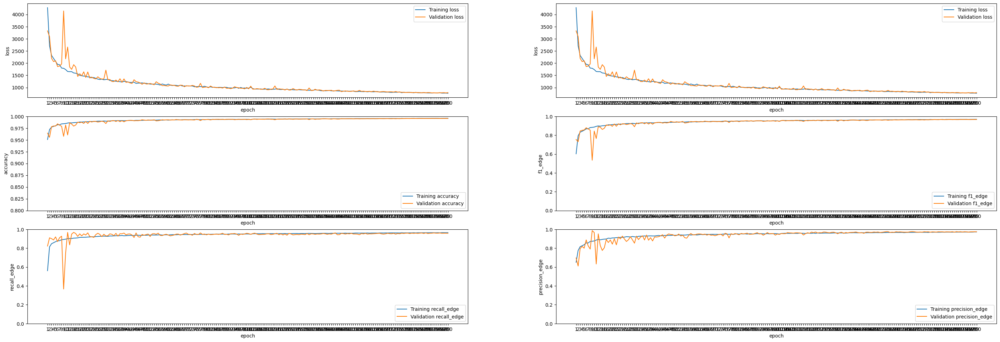

In [6]:
if Model.train_model:
    plot_losses = ["loss", "loss"]
    plot_metrics = ["accuracy", "f1_edge", "recall_edge", "precision_edge"]

    path = os.path.join(Model.Data.paths["FIGURES"], "training")

    plots.plot_training_history(history=history.history, list_of_loss_names=plot_losses,
                                list_of_metric_names=plot_metrics,
                                save=Model.cfg["SAVE"], path=path)

1/1 [==============================] - 1s 554ms/step


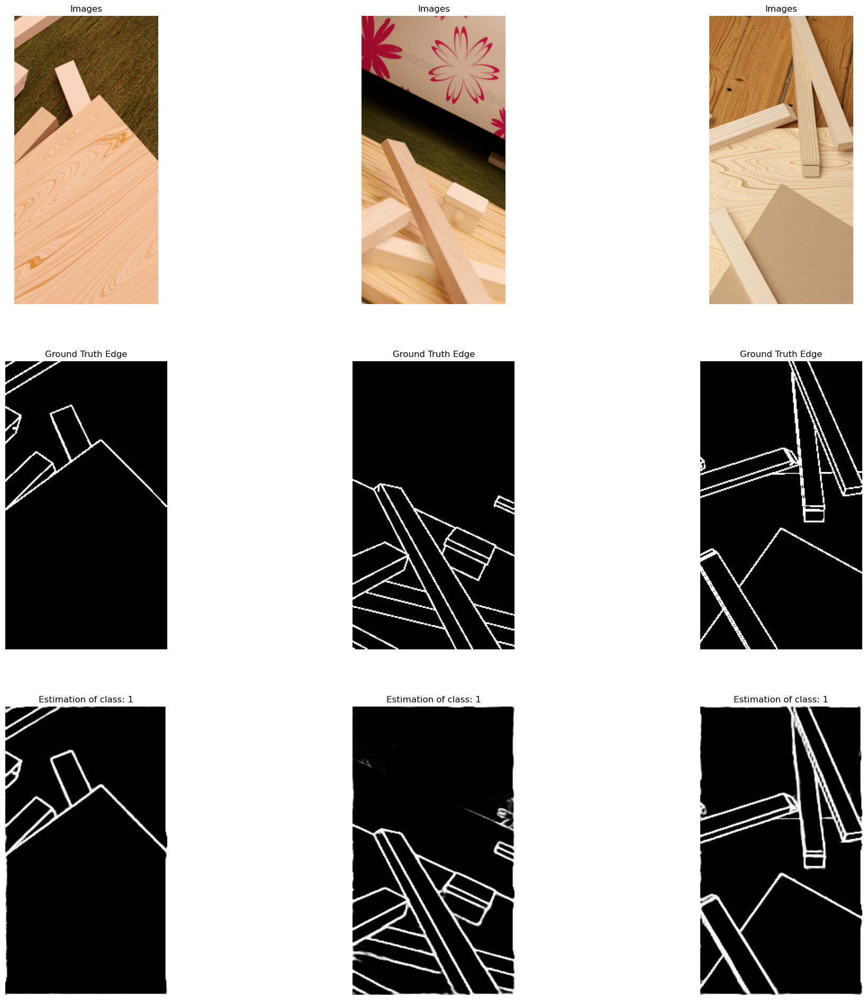

1/1 [==============================] - 0s 24ms/step


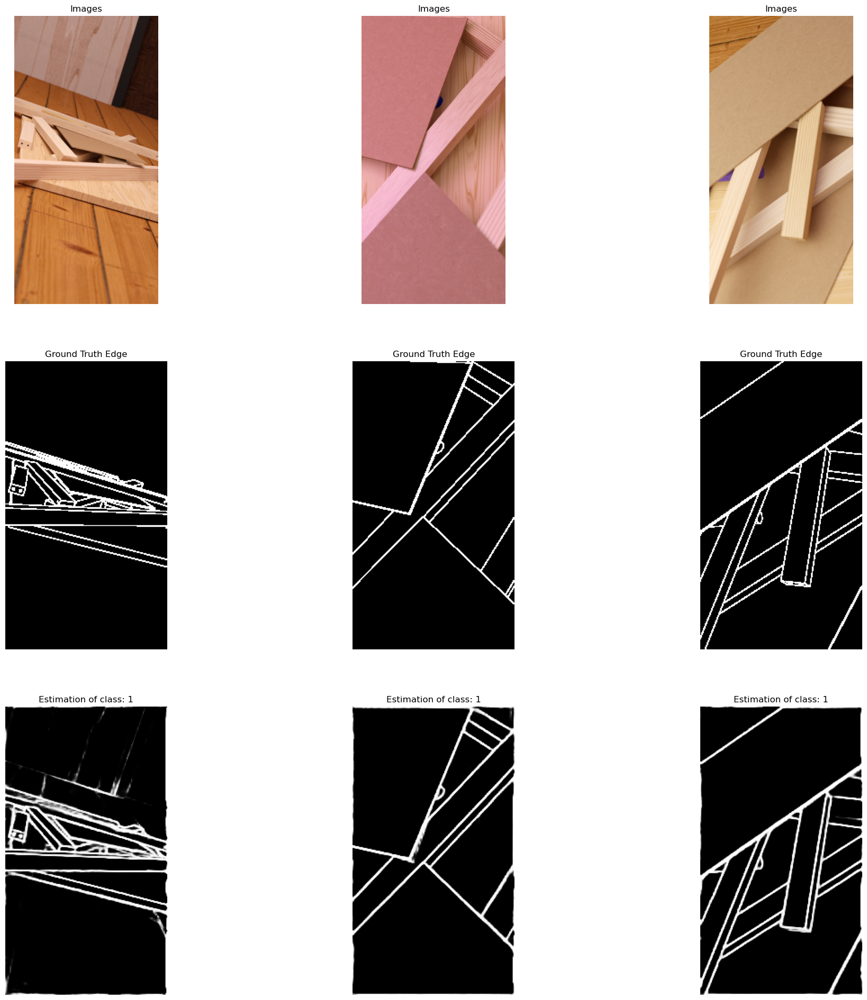

1/1 [==============================] - 0s 28ms/step


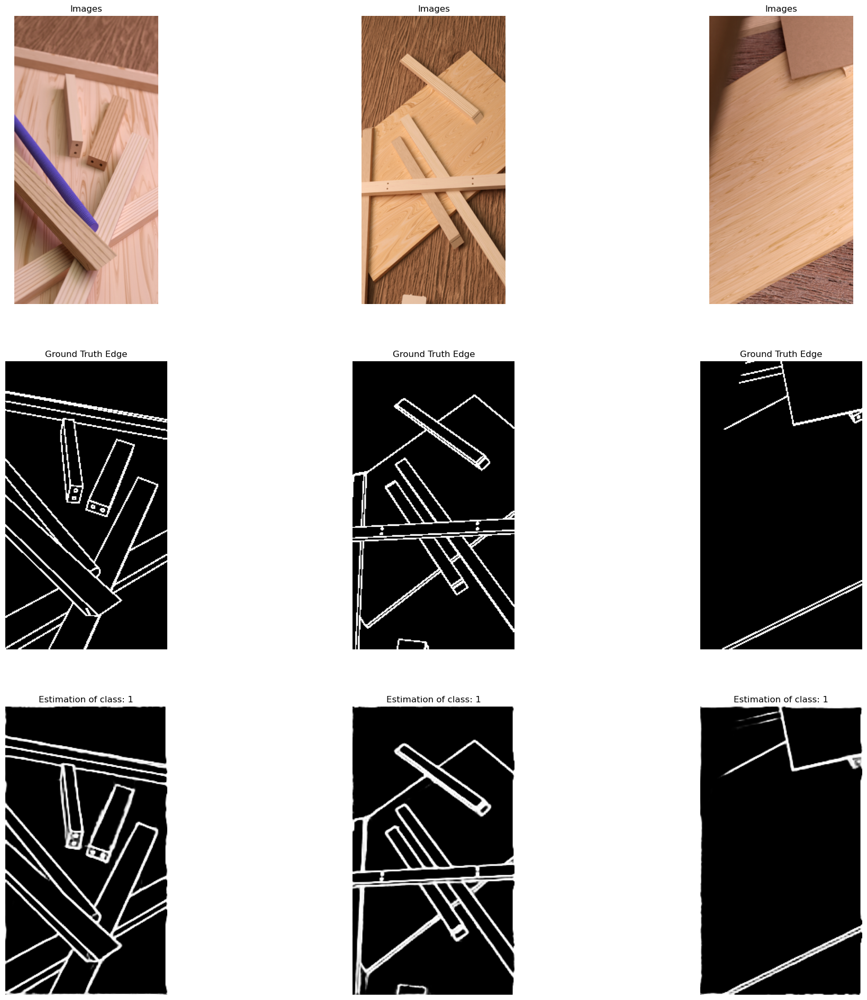

2023-02-03 02:15:31.881434: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


In [7]:
i = 0
for inp, out in test_ds.take(3):
    pred = model.predict(inp)
    path = os.path.join(Model.Data.paths["FIGURES"], "sd_prediction_{}".format(i))
    edge_detection_plots.plot_edges(images=inp['in_img'],
                                    labels_edge=out['out_edge'],
                                    predictions_edge=pred,
                                    batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'],
                                   save=Model.cfg["SAVE"], path=path)
    i += 1

1/1 [==============================] - 0s 103ms/step


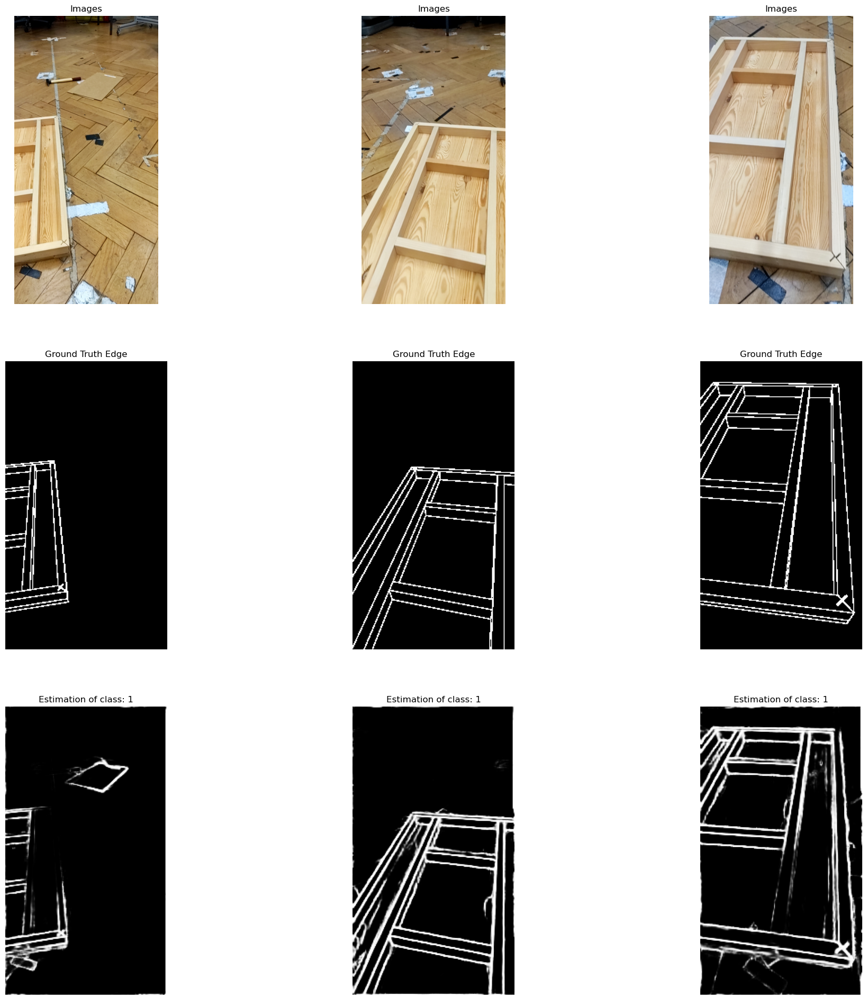

1/1 [==============================] - 0s 40ms/step


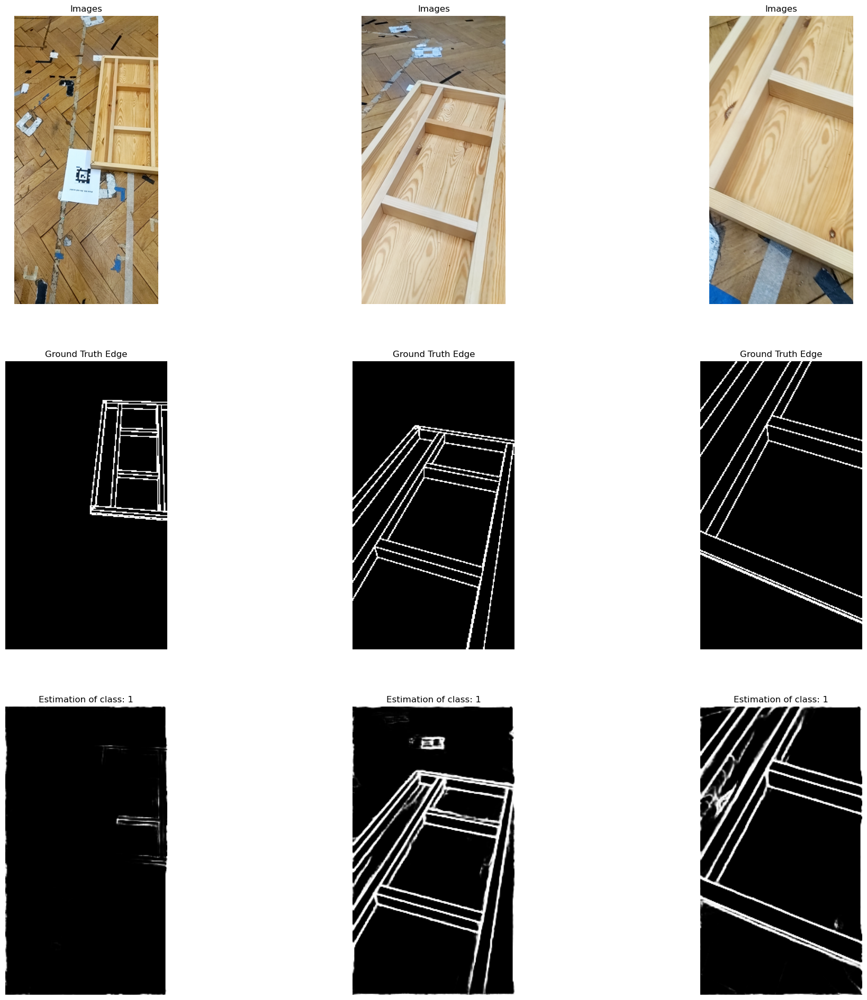

1/1 [==============================] - 0s 43ms/step


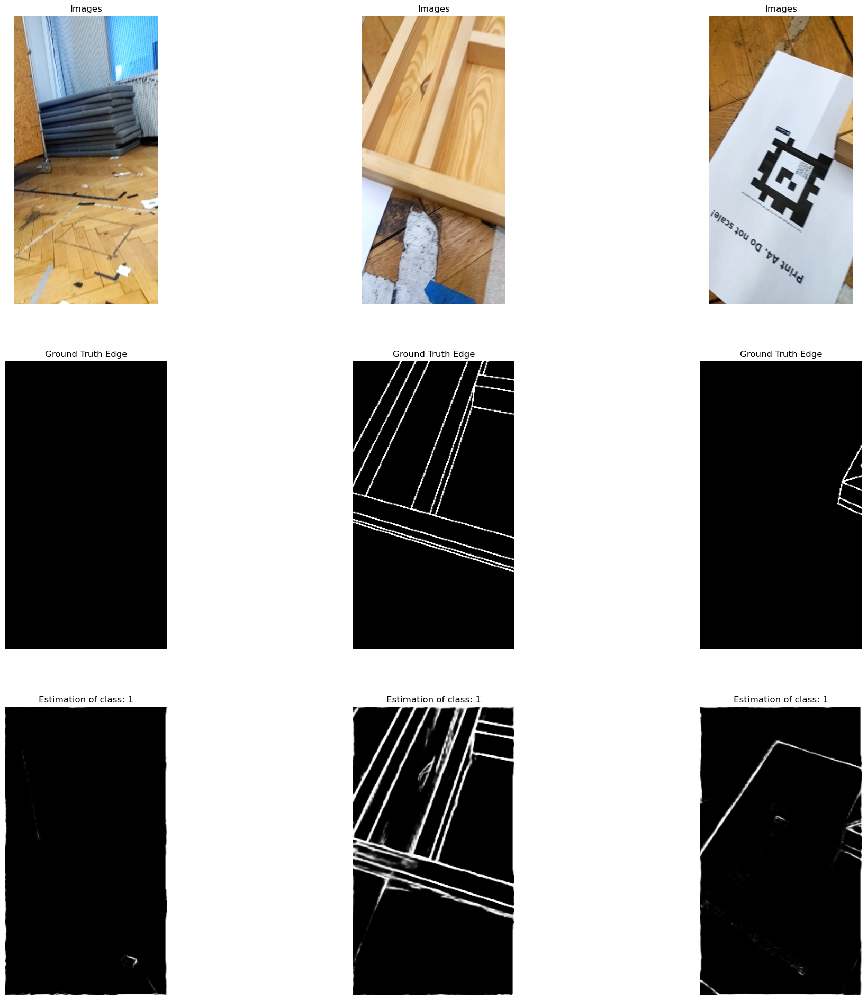

2023-02-03 02:15:36.946375: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


In [8]:
i = 0
for inp, out in real_world_ds.take(3):
    pred = model.predict(inp)
    path = os.path.join(Model.Data.paths["FIGURES"], "rwd_prediction_{}".format(i))
    edge_detection_plots.plot_edges(images=inp['in_img'],
                                    labels_edge=out['out_edge'],
                                    predictions_edge=pred,
                                    batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'],
                                   save=Model.cfg["SAVE"], path=path)
    i += 1

Max Accuracy Score = 0.995 at 0.400
MF1 = 0.960
MF1_1 = 0.960, ODS_1 = 0.400


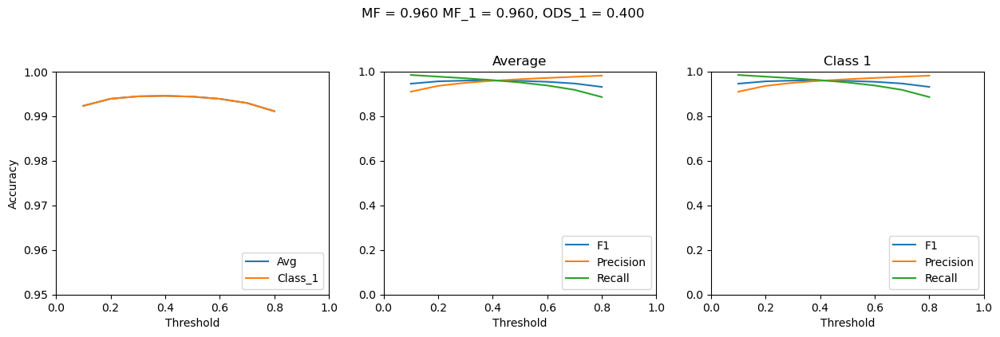

In [9]:
### Maximum F1 Score:
path = os.path.join(Model.Data.paths["FIGURES"], "threshold_metrics_evaluation_test_ds.svg")

Model.evaluate_and_plot_MF_score(model=model, dataset=test_ds, 
                                num_classes=DataProcessing.output_data_cfg["edge"]["num_classes"], path=path)

In [1]:
### Maximum F1 Score:
path = os.path.join(Model.Data.paths["FIGURES"], "threshold_metrics_evaluation_test_ds_pix_at_edge_0.svg")

Model.evaluate_and_plot_MF_score(model=model, dataset=test_ds, 
                                num_classes=DataProcessing.output_data_cfg["edge"]["num_classes"], 
                                num_pixels_region_of_attraction = 0.0,
                                path=path)

NameError: name 'os' is not defined

In [ ]:
### Maximum F1 Score:
path = os.path.join(Model.Data.paths["FIGURES"],"threshold_metrics_evaluation_image_ds.svg")

Model.evaluate_and_plot_MF_score(model=model, dataset=real_world_ds, 
                                num_classes=DataProcessing.output_data_cfg["edge"]["num_classes"], 
                                path=path, threshold_edge_width=1.0)

In [ ]:
if Model.cfg["CONVERT_TO_TFLITE"]:
    Model.convert_model_to_tflite(model)